<a href="https://colab.research.google.com/github/BrystofKlazek/Kod_Bakalarka/blob/main/Lab%203%20%E2%80%93%20Image%20Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![Header Lab 3](https://su2.utia.cas.cz/files/labs/23-203/header_lab3a.png)

This lab delves deeper into the realm of image processing and recognition, harnessing the capabilities of neural networks for tasks like image segmentation and object detection. We will explore the Unet architecture for segmentation and learn about training YOLO models for object detection, including the intricacies of custom data preparation and annotation with tools like CVAT. Furthermore, we'll examine image retrieval utilizing the renowned ResNet architecture and delve into the nuances of face recognition employing MTCNN and Arcface models. The curriculum is designed to build on your existing knowledge of neural network frameworks and will provide hands-on experience with these advanced techniques.

**Course website:** [su2.utia.cas.cz/labs.html](https://su2.utia.cas.cz/labs.html)

## Schedule
Lab 0 – Introduction to Python and Basic Machine Learning

Lab 1 – Fundamentals of Deep Learning with PyTorch

Lab 2 – Image Classification and Transfer Learning

*Lab 3 – Image Processing with Deep Learning*

Lab 4 – Sequence Models and NLP

Lab 5 – Advanced Vision and Generative Models

Lab 6 – Project Presentation

**Attendance:**

Absences are limited to 20% of the total sessions, i.e., only one lab from Labs 1-5 can be missed. Attendance for Lab 6, the Project Presentation, is mandatory for all students who wish to pass the course.
<br /><br />
Attendance consist of:
1.   Being present during the Lab session
2.   Completing all exercises (✍🏼)
3.   Saving changes to GitHub within 7 days of each Lab session




## Final assessment and class competition

<strong>Instruction, evaluation and other info:</strong>
<a href="https://su2.utia.cas.cz/labs.html#projects">https://su2.utia.cas.cz/labs.html#projects</a>
                       

# Part 1: Object detection


## Based on YOLOv5 - **Y**ou **O**nly **L**ook **O**nce


*   [github/ultralytics/yolov5](https://github.com/ultralytics/yolov5)
*   [Version history](https://docs.ultralytics.com/)



<img src="https://su2.utia.cas.cz/files/labs/23-203/yolo.png" width=400>

<img src="https://su2.utia.cas.cz/files/labs/23-203/yolo_model_comparison.png" width=400>

## Setup

In [ ]:
!pip install ultralytics

import cv2
import torch
import json


# Model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', device='cpu', _verbose=False)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 16.6 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(


Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
import requests
import zipfile
import os
import errno

filename = 'yolo_test_data.zip'
url = f'https://su2.utia.cas.cz/files/labs/23-203/{filename}'
try:
    os.mkdir(f'{filename[:-4]}')
    r = requests.get(url, allow_redirects=True, verify=False)
    open(filename, 'wb').write(r.content)
    with zipfile.ZipFile(filename, 'r') as zip_ref:
        zip_ref.extractall("")
except OSError as e:
    if e.errno != errno.EEXIST:
        raise
    else:
        print(f'{filename[:-4]} folder already exists!')

/usr/local/lib/python3.12/dist-packages/urllib3/connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'su2.utia.cas.cz'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


## Testing

*   Now we setup the model

In [ ]:
model.conf = 0.50  # NMS confidence threshold
model.iou = 0.80  # NMS IoU threshold
model.agnostic = False  # NMS class-agnostic
model.multi_label = False  # NMS multiple labels per box
# model.classes = [0, 2]
# model.max_det = 1000  # maximum number of detections per image
model.amp = False  # Automatic Mixed Precision (AMP) inference

Print all classes in YOLO:

In [ ]:
print(model.model.names)

{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'microw

*   Now we can test YOLO with our pictures

Processing >> yolo_test_data/test01/01.jpg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:898: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Processing >> yolo_test_data/test01/02.jpg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:898: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Processing >> yolo_test_data/test01/03.jpg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:898: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Processing >> yolo_test_data/test01/04.jpg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:898: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


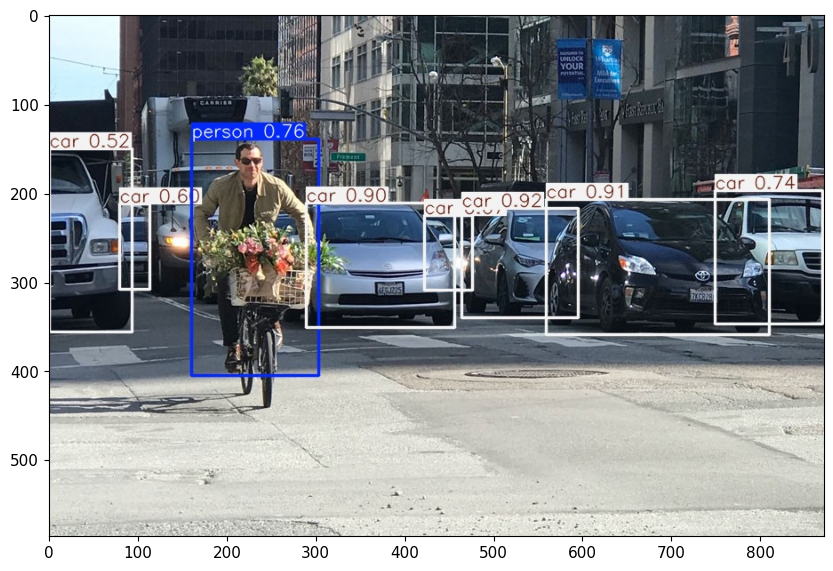

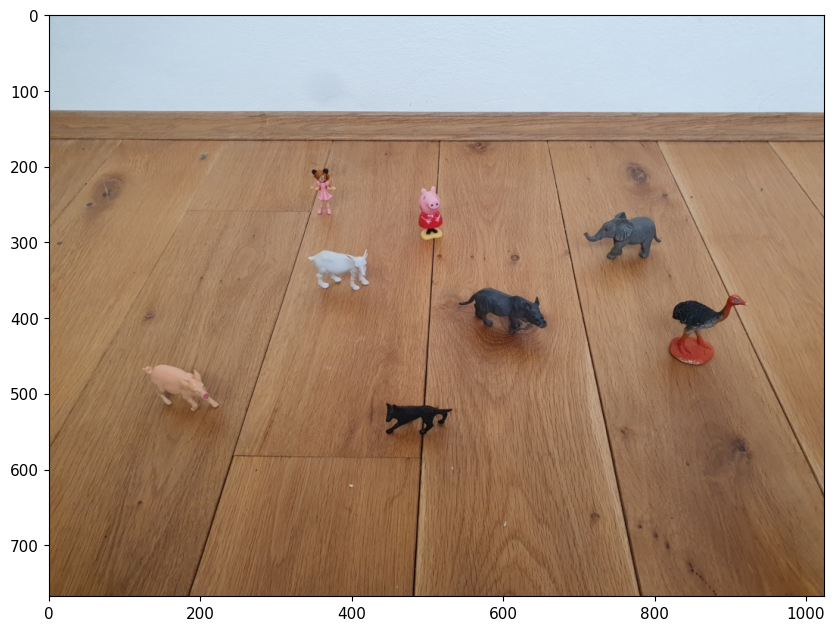

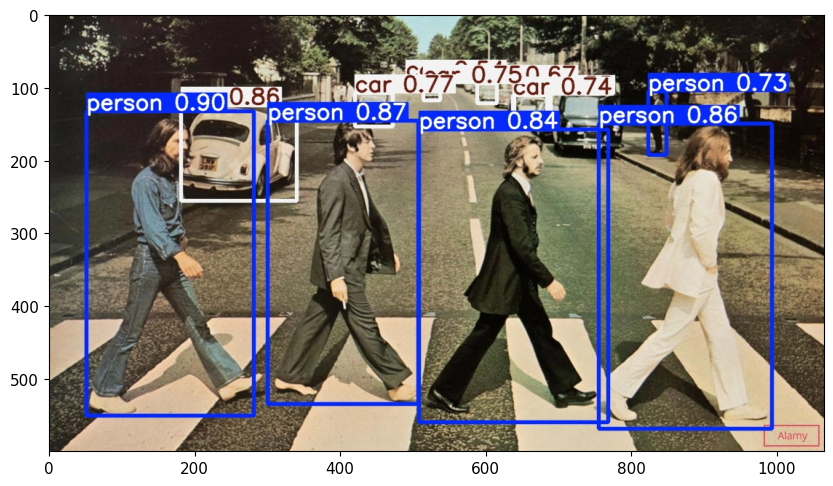

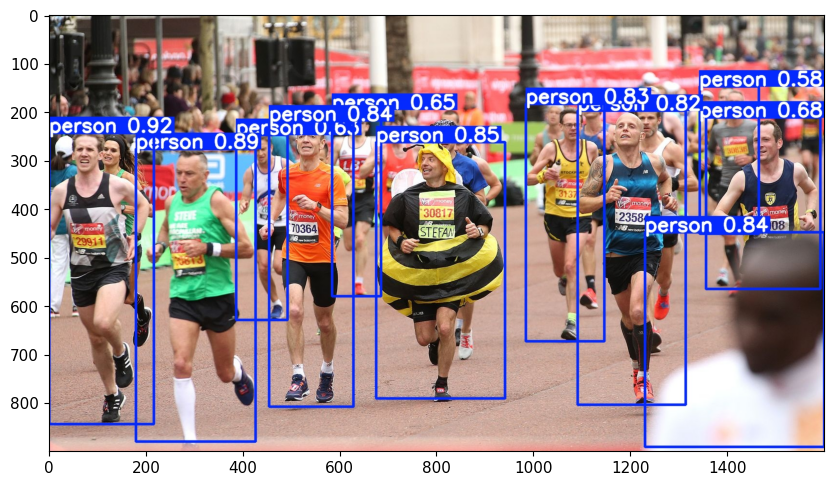

In [ ]:
import matplotlib.pyplot as plt
import glob
%matplotlib inline

source = 'yolo_test_data/test01/'
output_dir = 'yolo_test_data/output/'

fis = glob.glob(f'{source}*.jpg')
fis.sort()
for fi in fis:
  print(f'Processing >> {fi}')
  image = cv2.imread(fi)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  results = model(image, size=640)
  results.render()
  imgout = results.ims[0][:, :, ::-1]
  fi_name = fi.split('/')[-1]
  cv2.imwrite(f'{output_dir}{fi_name}',imgout)

# Show the output:
files = glob.glob(f'{output_dir}*.jpg')
files.sort()
imgs = [cv2.cvtColor(cv2.imread(f_name), cv2.COLOR_BGR2RGB) for f_name in files]
for idx in range(len(imgs)):
  plt.figure(figsize=(10,10))
  plt.imshow(imgs[idx])

*   Why does YOLO detect people with such a high success rate on the one hand and many other classes so poorly on the other?

<img src="https://staff.utia.cas.cz/novozada/ml2/mscocodataset.png">

## How to prepare your custom data?

#### CVAT from INTEL
https://github.com/openvinotoolkit/cvat


**(Voluntarily)**
1.   Install CVAT docker image
2.   RUN this docker image
3.   Go to http://localhost:8080/
4.   Create new task with labels
5.   Upload your images
6.   Mark objects with labels (use rectangle) on all images to finish this task
7.   Export your task with labels to YOLO 1.1 format
8.   Prepare the *.yaml file
9.   Train your YOLO weights

**I will show you CVAT tool on my side**
https://cvat.utia.cas.cz/





In [ ]:
import requests
import zipfile
import os
import errno

filename = 'cvatData.zip'
url = f'https://su2.utia.cas.cz/files/labs/23-203/{filename}'
try:
    os.mkdir(f'{filename[:-4]}')
    r = requests.get(url, allow_redirects=True, verify=False)
    open(filename, 'wb').write(r.content)
    with zipfile.ZipFile(filename, 'r') as zip_ref:
        zip_ref.extractall("")
except OSError as e:
    if e.errno != errno.EEXIST:
        raise
    else:
        print(f'{filename[:-4]} folder already exists!')

/usr/local/lib/python3.12/dist-packages/urllib3/connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'su2.utia.cas.cz'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


### Install Ultralytics:

In [ ]:
!pip install -U ultralytics
import torch, platform, os, sys
print("Torch:", torch.__version__, "| CUDA available", torch.cuda.is_available())

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 52.1 MB/s eta 0:00:00
Torch: 2.8.0+cu126 | CUDA available True


In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")
model.train(
    data="data.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    device=0  # -1=CPU, 0=první GPU
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.225 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_w

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d106847d670>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
from ultralytics import YOLO
import glob
from IPython.display import display
from PIL import Image
# cesta k modelu
best = "/content/runs/detect/train/weights/best.pt"
model = YOLO(best)

# složka s testovacími obrázky
test_dir = "/content/test/*.png"

# projít všechny .png soubory
for img_path in glob.glob(test_dir):
    results = model(img_path, conf=0.10)

    # vykreslit
    annotated = results[0].plot()  # získá obrázek s detekcemi
    display(Image.fromarray(annotated))

    print(f"Detekce pro: {img_path}")

## ✍🏼 Excercise 1
Write the answer after each question:
1.  What type of objects can YOLO (You Only Look Once) detect in images or videos? - BAsed on the code run previously, its these:
{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'microwave', 69: 'oven', 70: 'toaster', 71: 'sink', 72: 'refrigerator', 73: 'book', 74: 'clock', 75: 'vase', 76: 'scissors', 77: 'teddy bear', 78: 'hair drier', 79: 'toothbrush'}


2.  How is YOLO different from other object detection methods in terms of speed and accuracy? It processes images in a simple pass utilizing the fact that some calculations are the same for all the runs and the fact that GPUs allow for threading individual convolutions etc. Due to that it is faster without sacrificing any accuracy

# Part 2: Image Retrieval

## Load packages

In [30]:
import torch
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torchvision import models
import torch.nn as nn
import numpy as np
import cv2 as cv
import pandas as pd
from PIL import Image, ImageDraw, ImageFont, ImageFile
import glob
import matplotlib.pyplot as plt

## Setup


Some helping functions...

In [31]:
class Noetm(Dataset):
    def __init__(self, img=[], transform=None):
        self.transform = transform
        self.img = img
        self.dataset_N = 1

    def __len__(self):
        return self.dataset_N

    def __getitem__(self, idx):
        img = self.img
        if self.transform is not None:
            img = self.transform(img)
        return img, ''


class FeatureExtractor(object):
  def __init__(self):
    print("create instance of feature_extrator")
    self.dataloader = []

    print("Resnet152 architecture selected ...")
    self.model = self.loadModel()
    self.model.eval()

  def loadModel(self):
    print("Loading resnet152 architecture ...")
    model = models.resnet152(pretrained=True)
    for param in model.parameters():
        param.requires_grad = False
    model = nn.Sequential(*list(model.children())[:-1])
    return model

  def get_features_numpy(self):
    self.model.eval()
    with torch.no_grad():
      for i, data in enumerate(self.dataloader):
        inputs = data[0]
        tensors = inputs
        print(f'Processing image feature...')
        features_tensor = self.model(tensors)
        features_tensor = torch.flatten(features_tensor, start_dim=1)
        features_np = features_tensor.detach().cpu().numpy()
    return features_np


def get_image_features_in_numpy(img):
  img_RGB = cv.cvtColor(img, cv.COLOR_BGR2RGB)
  img_pil = Image.fromarray(img_RGB)
  retrieval_data.img = img_pil
  imgloader = DataLoader(retrieval_data, batch_size=batch_size, shuffle=False, num_workers=num_workers)
  retrieval_extractor.dataloader = imgloader
  features_np = retrieval_extractor.get_features_numpy()
  return features_np


def decorate_img(img, l2norm, img_height=372):
  scale = img_height / img.shape[0]
  width = int(img.shape[1] * scale)
  new_size = (width, img_height)
  img = cv.resize(img, new_size, interpolation=cv.INTER_CUBIC)

  font = cv.FONT_HERSHEY_SIMPLEX
  x, y, w, h = 0, 0, 200, 50
  img = cv.rectangle(img, (x, y), (x + w, y + h), (0, 0, 0), -1)
  img = cv.putText(img, f'dis = {l2norm:.4f}', (x + int(w / 10), y + int(h / 2)),
                  font, 0.7, (255, 255, 255), 2)
  return img


def visualize_comparison(imgs, l2norms):
  img_decorated = [decorate_img(img, l2norm) for img, l2norm in zip(imgs, l2norms)]
  img_final = np.concatenate(img_decorated, axis=1)
  return img_final


def get_features_folder(folder):
  ext = ['png', 'jpg', 'jpeg']
  files = []
  [files.extend(glob.glob(folder + '/*.' + e)) for e in ext]
  files.sort()
  imgs = [cv.imread(temp) for temp in files]
  features_all = np.concatenate([get_image_features_in_numpy(temp) for temp in imgs])
  return features_all, files, imgs


def compare_features(file, files, imgs, features_all):
  img = cv.imread(file)
  featuers_img = get_image_features_in_numpy(img)
  diff = features_all - featuers_img
  l2_norm = np.linalg.norm(diff, axis=1)
  ind_sorted = l2_norm.argsort()
  img_out = visualize_comparison(list(imgs[i] for i in ind_sorted), l2_norm[ind_sorted])

  return img_out


Some other settings...

In [32]:
batch_size = 64
num_workers = 2
backbone = "resnet152"

transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

retrieval_data = Noetm(transform=transform_test)
retrieval_extractor = FeatureExtractor()

create instance of feature_extrator
Resnet152 architecture selected ...
Loading resnet152 architecture ...
Downloading: "https://download.pytorch.org/models/resnet152-394f9c45.pth" to /root/.cache/torch/hub/checkpoints/resnet152-394f9c45.pth


100%|██████████| 230M/230M [00:01<00:00, 184MB/s]


## Download data

In [33]:
import requests
import zipfile
import os
import errno

filename = 'image_retrieval.zip'
url = f'https://su2.utia.cas.cz/files/labs/23-203/{filename}'
try:
  os.mkdir(f'{filename[:-4]}')
  r = requests.get(url, allow_redirects=True, verify=False)
  open(filename, 'wb').write(r.content)
  with zipfile.ZipFile(filename, 'r') as zip_ref:
    zip_ref.extractall("")
except OSError as e:
  if e.errno != errno.EEXIST:
    raise
  else:
      print(f'{filename[:-4]} folder already exists!')

## Process images

In [34]:
folder = './image_retrieval/'
features_all, files, imgs = get_features_folder(folder)

Processing image feature...
Processing image feature...
Processing image feature...
Processing image feature...
Processing image feature...
Processing image feature...
Processing image feature...
Processing image feature...


Processing image feature...
Processing image feature...
Processing image feature...
Processing image feature...
Processing image feature...
Processing image feature...
Processing image feature...
Processing image feature...


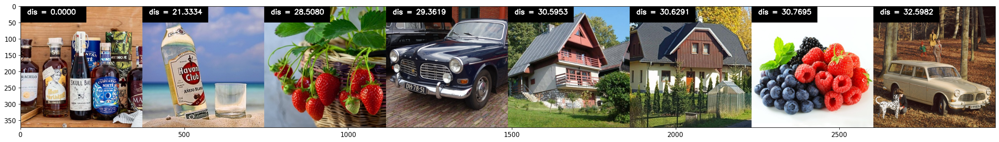

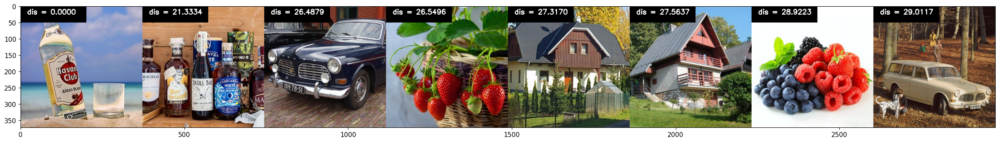

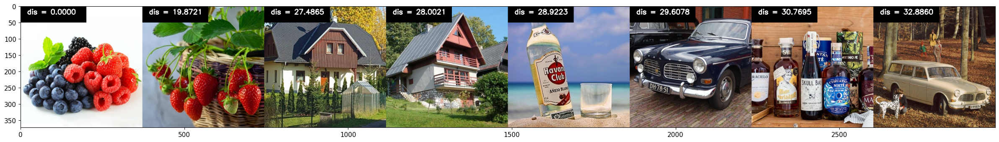

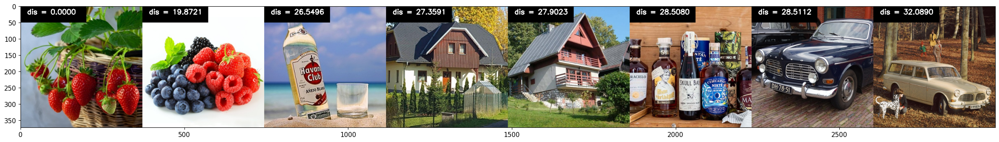

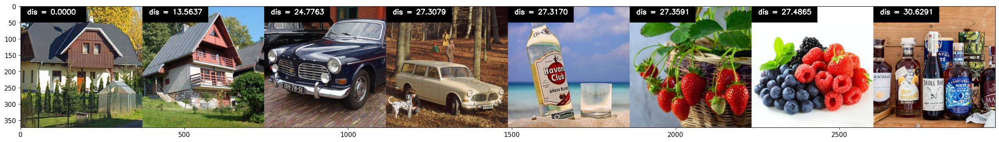

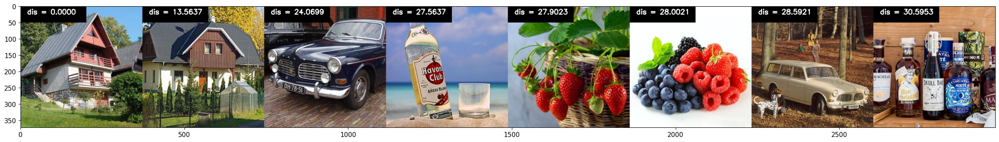

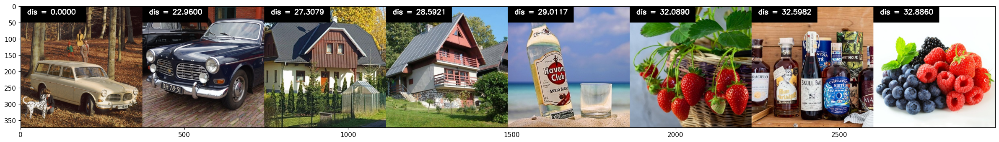

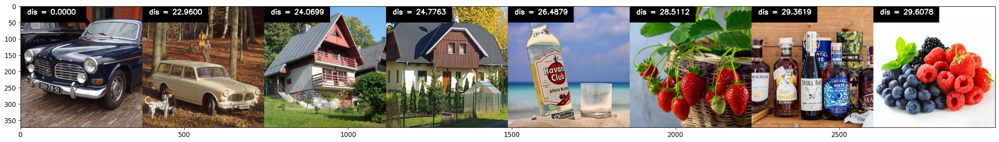

In [35]:
for idx in range(len(files)):
    file = f'{folder}img0{idx+1}.jpg'
    img_out = compare_features(file, files, imgs, features_all)
    plt.figure(figsize=(30,10))
    plt.imshow(cv.cvtColor(img_out,cv.COLOR_BGR2RGB))

## ✍🏼 Excercise 2
Write 2 questions about Image Retrieval that come to mind.
1.  ...
2.  ...

# Part 3: Face Recognition

## Download data and models

In [ ]:
import requests
import zipfile
import os
import errno

In [ ]:
filename = 'src.zip'
url = f'https://su2.utia.cas.cz/files/labs/23-203/{filename}'
try:
  os.mkdir(f'{filename[:-4]}')
  r = requests.get(url, allow_redirects=True, verify=False)
  open(filename, 'wb').write(r.content)
  with zipfile.ZipFile(filename, 'r') as zip_ref:
    zip_ref.extractall("")
except OSError as e:
  if e.errno != errno.EEXIST:
    raise
  else:
      print(f'{filename[:-4]} folder already exists!')

/usr/local/lib/python3.12/dist-packages/urllib3/connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'su2.utia.cas.cz'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

## Install packages

☕ Hey! Let’s grab a coffee! The installation should finish in about 3-5 minutes. If there's an error, you can catch it by deleting `%%capture`.

In [ ]:
%%capture
!pip install facenet-pytorch torch torchvision imutils scipy

In [ ]:
!pip uninstall -y Pillow
!pip install Pillow==9.5.0

Found existing installation: pillow 10.2.0
Uninstalling pillow-10.2.0:
  Successfully uninstalled pillow-10.2.0
  Using cached Pillow-9.5.0-cp312-cp312-linux_x86_64.whl
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
facenet-pytorch 2.6.0 requires Pillow<10.3.0,>=10.2.0, but you have pillow 9.5.0 which is incompatible.
scikit-image 0.25.2 requires pillow>=10.1, but you have pillow 9.5.0 which is incompatible.


## Load packages

In [ ]:
import os
import cv2
import numpy as np
import torch
from facenet_pytorch import MTCNN
from torchvision import transforms
from sklearn import preprocessing
from skimage import transform as trans
from scipy.spatial.distance import cosine
from src.face_recognition.arcface.model import iresnet_inference
from google.colab.patches import cv2_imshow

In [ ]:
# Image preprocessing based on REFERENCE CODE
def preprocess(img, bbox=None, landmark=None):
    image_size = (112, 112)
    if landmark is not None:
        src = np.array([
            [30.2946, 51.6963],
            [65.5318, 51.5014],
            [48.0252, 71.7366],
            [33.5493, 92.3655],
            [62.7299, 92.2041]], dtype=np.float32)
        src[:, 0] += 8.0 if image_size[1] == 112 else 0
        dst = landmark.astype(np.float32)
        tform = trans.SimilarityTransform()
        tform.estimate(dst, src)
        M = tform.params[0:2, :]
        warped = cv2.warpAffine(img, M, image_size, borderValue=0.0)
    else:
        warped = cv2.resize(img, image_size)
    return warped

@torch.no_grad()
def get_feature(model, aligned):
    aligned = np.transpose(aligned, (1, 2, 0))
    face_preprocess = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((112, 112)),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    ])
    aligned = face_preprocess(aligned).unsqueeze(0).to(device)
    output = model(aligned).cpu().numpy()
    embedding = preprocessing.normalize(output).flatten()
    return embedding

def get_faces_in_json(img, detector, model):
    json_structure = {
        "imageSize": {
            "width": img.shape[1],
            "height": img.shape[0]
        },
        "faces": []
    }
    detection = detector.detect(img, landmarks=True)
    if detection:
        boxes, probs, landmarks = detection
        if boxes is not None:
            for i, bbox in enumerate(boxes):
                bbox = bbox.astype(int)
                points = landmarks[i]
                nimg = preprocess(img, bbox, points)
                aligned = np.transpose(nimg, (2, 0, 1))
                features = get_feature(model, aligned)
                json_structure["faces"].append({
                    "boxes": {"x1": bbox[0], "y1": bbox[1], "x2": bbox[2], "y2": bbox[3], "score": float(probs[i])},
                    "eye_left": {"x": float(points[0][0]), "y": float(points[0][1])},
                    "eye_right": {"x": float(points[1][0]), "y": float(points[1][1])},
                    "eye_nose": {"x": float(points[2][0]), "y": float(points[2][1])},
                    "mouth_left": {"x": float(points[3][0]), "y": float(points[3][1])},
                    "mouth_right": {"x": float(points[4][0]), "y": float(points[4][1])},
                    "features": features.tolist()
                })
    return json_structure

def distance_matrix_faces(json_structure1, json_structure2):
    num_faces1 = len(json_structure1['faces'])
    num_faces2 = len(json_structure2['faces'])
    distance_matrix = np.zeros((num_faces1, num_faces2))
    for idx1 in range(num_faces1):
        for idx2 in range(num_faces2):
            emb1 = np.array(json_structure1['faces'][idx1]['features'])
            emb2 = np.array(json_structure2['faces'][idx2]['features'])
            distance_matrix[idx1, idx2] = cosine(emb1, emb2)
    return distance_matrix

def visualize_comparison(img1, img2, json_structure1, json_structure2, distance_matrix):
    IMG_SIZE_MATRIX = 256
    num_faces1 = len(json_structure1['faces'])
    num_faces2 = len(json_structure2['faces'])
    size = ((num_faces1 + 1) * IMG_SIZE_MATRIX, (num_faces2 + 1) * IMG_SIZE_MATRIX, 3)
    img_out = np.ones(size, dtype=np.uint8) * 255
    for idx1 in range(num_faces1):
        img_out[(idx1 + 1) * IMG_SIZE_MATRIX:(idx1 + 2) * IMG_SIZE_MATRIX, 0:IMG_SIZE_MATRIX, :] = crop_face(img1, json_structure1['faces'][idx1]['boxes'])
        for idx2 in range(num_faces2):
            img_write_text(img_out, ((idx2 + 1) * IMG_SIZE_MATRIX + 50, (idx1 + 1) * IMG_SIZE_MATRIX + 80), f'{distance_matrix[idx1, idx2]:.3f}')
    for idx2 in range(num_faces2):
        img_out[0:IMG_SIZE_MATRIX, (idx2 + 1) * IMG_SIZE_MATRIX:(idx2 + 2) * IMG_SIZE_MATRIX, :] = crop_face(img2, json_structure2['faces'][idx2]['boxes'])
    return img_out

# Define crop_face function
def crop_face(img, bb, IMG_SIZE_MATRIX=256):
    crop = img[bb['y1']:bb['y2'], bb['x1']:bb['x2']]
    height = IMG_SIZE_MATRIX
    scale = height / crop.shape[0]
    width = int(crop.shape[1] * scale)
    new_size = (width, height)
    crop_resized = cv2.resize(crop, new_size, interpolation=cv2.INTER_CUBIC)
    if width < height:
        WHITE = [255, 255, 255]
        crop_resized = cv2.copyMakeBorder(crop_resized, 0, 0, height - width, 0, cv2.BORDER_CONSTANT, value=WHITE)
    return crop_resized

# Define img_write_text function
def img_write_text(img, bottom_left_corner, text, font_color=(0, 0, 0), font_scale=2, thickness=3):
    font = cv2.FONT_HERSHEY_SIMPLEX
    line_type = 2
    img = cv2.putText(img, text, bottom_left_corner, font, font_scale, font_color, thickness, line_type)
    return img

def show_faces(img, json_structure):
    out = img.copy()
    size_circle = 4
    size_line = 2

    for face in json_structure['faces']:
        # Draw circles on facial landmarks
        cv2.circle(out, (int(face['eye_left']['x']), int(face['eye_left']['y'])), size_circle, (0, 255, 0), -1)  # Eye_left
        cv2.circle(out, (int(face['eye_right']['x']), int(face['eye_right']['y'])), size_circle, (0, 255, 0), -1)  # Eye_right
        cv2.circle(out, (int(face['eye_nose']['x']), int(face['eye_nose']['y'])), size_circle, (0, 255, 0), -1)  # Nose
        cv2.circle(out, (int(face['mouth_left']['x']), int(face['mouth_left']['y'])), size_circle, (0, 255, 0), -1)  # Mouth_left
        cv2.circle(out, (int(face['mouth_right']['x']), int(face['mouth_right']['y'])), size_circle, (0, 255, 0), -1)  # Mouth_right

        # Draw lines connecting facial landmarks
        cv2.line(out, (int(face['eye_left']['x']), int(face['eye_left']['y'])), (int(face['eye_right']['x']), int(face['eye_right']['y'])), (220, 220, 220), size_line)  # Eye_left - Eye_right
        cv2.line(out, (int(face['eye_left']['x']), int(face['eye_left']['y'])), (int(face['eye_nose']['x']), int(face['eye_nose']['y'])), (220, 220, 220), size_line)  # Eye_left - Nose
        cv2.line(out, (int(face['eye_right']['x']), int(face['eye_right']['y'])), (int(face['eye_nose']['x']), int(face['eye_nose']['y'])), (220, 220, 220), size_line)  # Eye_right - Nose
        cv2.line(out, (int(face['mouth_left']['x']), int(face['mouth_left']['y'])), (int(face['eye_nose']['x']), int(face['eye_nose']['y'])), (220, 220, 220), size_line)  # Mouth_left - Nose
        cv2.line(out, (int(face['mouth_right']['x']), int(face['mouth_right']['y'])), (int(face['eye_nose']['x']), int(face['eye_nose']['y'])), (220, 220, 220), size_line)  # Mouth_right - Nose
        cv2.line(out, (int(face['mouth_right']['x']), int(face['mouth_right']['y'])), (int(face['mouth_left']['x']), int(face['mouth_left']['y'])), (220, 220, 220), size_line)  # Mouth_right - Mouth_left

    return out

## Face recognition

**Face recognition STS-51-L crew**

35 Years Ago: Remembering Challenger and Her Crew

The Challenger space shuttle disaster, took the lives of five NASA astronauts and two payload specialists.

[In memory of the STS-51-L crew](https://www.nasa.gov/feature/35-years-ago-remembering-challenger-and-her-crew)


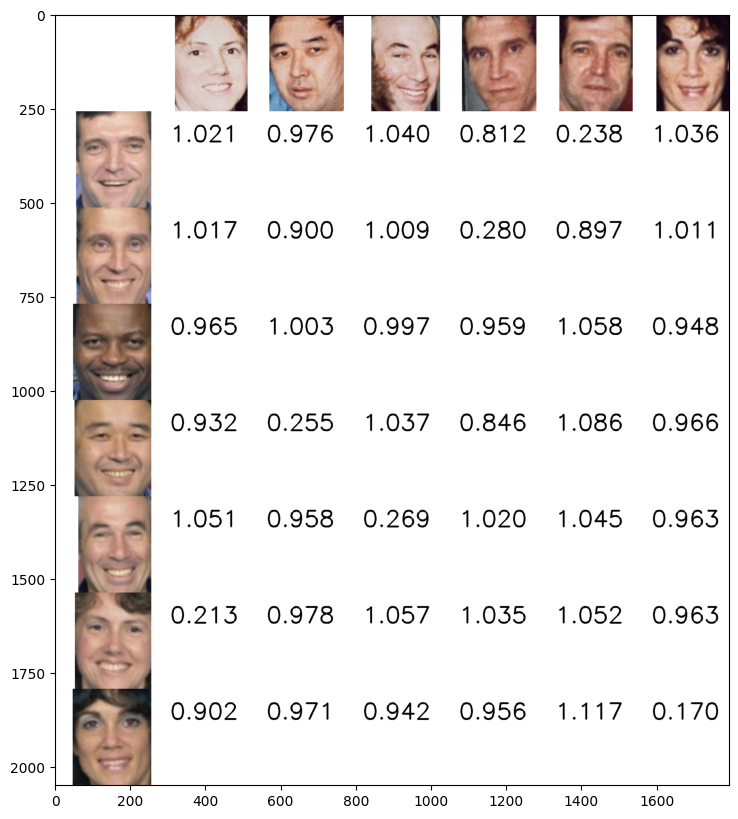

In [ ]:
# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize MTCNN for face detection and ArcFace for feature extraction
detector = MTCNN(keep_all=True, thresholds=[0.7, 0.8, 0.95], device=device)
classifier = iresnet_inference(model_name="r100", path="src/face_recognition/arcface/weights/arcface_r100.pth", device=device)


# Process example images
file1 = "src/nasa1.jpg"
file2 = "src/nasa2.jpg"
img1 = cv2.imread(file1)
img2 = cv2.imread(file2)


json_structure1 = get_faces_in_json(img1, detector, classifier)
json_structure2 = get_faces_in_json(img2, detector, classifier)

distance_matrix = distance_matrix_faces(json_structure1, json_structure2)
output_image = visualize_comparison(img1, img2, json_structure1, json_structure2, distance_matrix)

# Display output image
import matplotlib.pyplot as plt
plt.figure(figsize=(30,10))
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
plt.show()

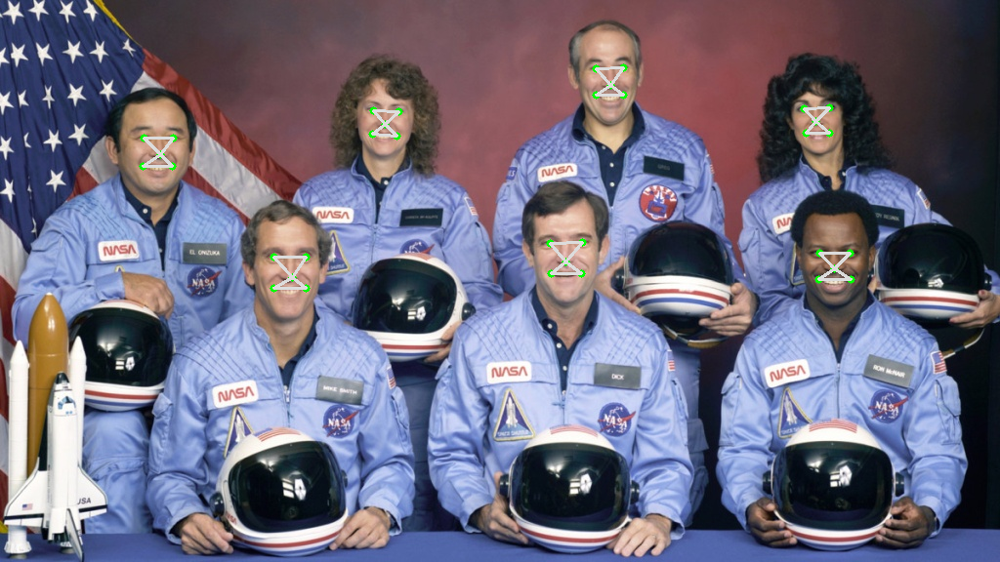

In [ ]:
show_faces(img1,json_structure1)
cv2_imshow(show_faces(img1,json_structure1))

## ✍🏼 Excercise 3
Write the answer after each question:
1.  What are some common uses for face recognition technology in everyday applications?
2.  Is there any security risk in face logging - describe any such scenario?
-----
3. Try out the technology on family photos at home. (optional)

# Part 4: Segmentation by U-net

**Original paper:** https://arxiv.org/abs/1505.04597

## U-Net: Convolutional Networks for Biomedical Image Segmentation

- **U-Shape architecture** is characterized by its **U-shaped** structure, designed for fast and precise segmentation of images.

- **Contracting Path (left side)** mimics a typical CNN, capturing context through alternating convolutions and max pooling operations.

- **Expanding path (right side)** involves upsampling the feature maps, followed by a convolution, and concatenation with the corresponding feature map from the contracting path.

- **Skip connections** bridge the contracting and expanding paths, providing essential high-resolution features for precise localization.

- **Functionality:** U-net excels at **image segmentation**, localizing and identifying target structures within an image, a critical task in medical imaging.

- **Efficiency with Data:** Designed to work well with limited training data, U-Net can perform effectively where annotated datasets are scarce.

- **Applications:** Originally for biomedical image segmentation, U-Net's utility extends to various image segmentation tasks requiring detailed output maps.

<img src="https://su2.utia.cas.cz/files/labs/23-203/UNET.png" width=800>

**Let's give it a try:**
First we need to download the dataset.
The original data comes from Kaggle:<br />https://www.kaggle.com/competitions/carvana-image-masking-challenge

We resize all images and their mask to 240x160 pixels.

In [ ]:
import requests
import zipfile
import os
import errno

filename = 'unet_segmentation.zip'
url = f'http://su2.utia.cas.cz/files/labs/23-203/{filename}'
try:
    os.mkdir(f'{filename[:-4]}')
    r = requests.get(url, allow_redirects=True, verify=False)
    open(filename, 'wb').write(r.content)
    with zipfile.ZipFile(filename, 'r') as zip_ref:
        zip_ref.extractall("")
except OSError as e:
    if e.errno != errno.EEXIST:
        raise
    else:
        print(f'{filename[:-4]} folder already exists!')

/usr/local/lib/python3.12/dist-packages/urllib3/connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'su2.utia.cas.cz'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Now we will set how to work with the dataset.

In [ ]:
import os
from PIL import Image
from torch.utils.data import Dataset
import numpy as np

class CarvanaDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = os.listdir(image_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        img_path = os.path.join(self.image_dir, self.images[index])
        mask_path = os.path.join(self.mask_dir, self.images[index].replace(".jpg", "_mask.gif"))
        image = np.array(Image.open(img_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"), dtype=np.float32)
        mask[mask == 255.0] = 1.0

        if self.transform is not None:
            augmentations = self.transform(image=image, mask=mask)
            image = augmentations["image"]
            mask = augmentations["mask"]

        return image, mask

Some auxiliary functions:

In [ ]:
import torch
import torchvision
from torch.utils.data import DataLoader

def save_checkpoint(state, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    torch.save(state, filename)

def load_checkpoint(checkpoint, model):
    print("=> Loading checkpoint")
    model.load_state_dict(checkpoint["state_dict"])

def get_loaders(
    train_dir,
    train_maskdir,
    val_dir,
    val_maskdir,
    batch_size,
    train_transform,
    val_transform,
    num_workers=4,
    pin_memory=True,
):
    train_ds = CarvanaDataset(
        image_dir=train_dir,
        mask_dir=train_maskdir,
        transform=train_transform,
    )

    train_loader = DataLoader(
        train_ds,
        batch_size=batch_size,
        num_workers=num_workers,
        pin_memory=pin_memory,
        shuffle=True,
    )

    val_ds = CarvanaDataset(
        image_dir=val_dir,
        mask_dir=val_maskdir,
        transform=val_transform,
    )

    val_loader = DataLoader(
        val_ds,
        batch_size=batch_size,
        num_workers=num_workers,
        pin_memory=pin_memory,
        shuffle=False,
    )

    return train_loader, val_loader

def check_accuracy(loader, model, device="cuda"):
    num_correct = 0
    num_pixels = 0
    dice_score = 0
    model.eval()

    with torch.no_grad():
        for x, y in loader:
            x = x.to(device)
            y = y.to(device).unsqueeze(1)
            preds = torch.sigmoid(model(x))
            preds = (preds > 0.5).float()
            num_correct += (preds == y).sum()
            num_pixels += torch.numel(preds)
            dice_score += (2 * (preds * y).sum()) / (
                (preds + y).sum() + 1e-8
            )

    print(
        f"Got {num_correct}/{num_pixels} with acc {num_correct/num_pixels*100:.2f}"
    )
    print(f"Dice score: {dice_score/len(loader)}")
    model.train()

def save_predictions_as_imgs(
    loader, model, folder="saved_images/", device="cuda"
):
    model.eval()
    for idx, (x, y) in enumerate(loader):
        x = x.to(device=device)
        with torch.no_grad():
            preds = torch.sigmoid(model(x))
            preds = (preds > 0.5).float()
        torchvision.utils.save_image(
            preds, f"{folder}/pred_{idx}.png"
        )
        torchvision.utils.save_image(y.unsqueeze(1), f"{folder}{idx}.png")

    model.train()

Architecture of the U-net model:
<img src="https://su2.utia.cas.cz/files/labs/23-203/UNET.png" width=400>

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms.functional as TF

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)

class UNET(nn.Module):
    def __init__(
            self, in_channels=3, out_channels=1, features=[64, 128, 256, 512],
    ):
        super(UNET, self).__init__()
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Down part of UNET
        for feature in features:
            self.downs.append(DoubleConv(in_channels, feature))
            in_channels = feature

        # Up part of UNET
        for feature in reversed(features):
            self.ups.append(
                nn.ConvTranspose2d(
                    feature*2, feature, kernel_size=2, stride=2,
                )
            )
            self.ups.append(DoubleConv(feature*2, feature))

        self.bottleneck = DoubleConv(features[-1], features[-1]*2)
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x):
        skip_connections = []

        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)

        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]

        for idx in range(0, len(self.ups), 2):
            x = self.ups[idx](x)
            skip_connection = skip_connections[idx//2]

            if x.shape != skip_connection.shape:
                x = TF.resize(x, size=skip_connection.shape[2:])

            concat_skip = torch.cat((skip_connection, x), dim=1)
            x = self.ups[idx+1](concat_skip)

        return self.final_conv(x)

def test():
    x = torch.randn((3, 1, 161, 161))
    model = UNET(in_channels=1, out_channels=1)
    preds = model(x)
    assert preds.shape == x.shape

if __name__ == "__main__":
    test()

Defining the training process and starting the main loop:

In [ ]:
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm
import torch.nn as nn
import torch.optim as optim

# Hyperparameters etc.
LEARNING_RATE = 1e-4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
BATCH_SIZE = 16
NUM_EPOCHS = 3
NUM_WORKERS = 2
IMAGE_HEIGHT = 160
IMAGE_WIDTH = 240
PIN_MEMORY = True
LOAD_MODEL = False
TRAIN_IMG_DIR = "data/train_images/"
TRAIN_MASK_DIR = "data/train_masks/"
VAL_IMG_DIR = "data/val_images/"
VAL_MASK_DIR = "data/val_masks/"

def train_fn(loader, model, optimizer, loss_fn, scaler):
    loop = tqdm(loader)

    for batch_idx, (data, targets) in enumerate(loop):
        data = data.to(device=DEVICE)
        targets = targets.float().unsqueeze(1).to(device=DEVICE)

        # forward
        with torch.cuda.amp.autocast():
            predictions = model(data)
            loss = loss_fn(predictions, targets)

        # backward
        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        # update tqdm loop
        loop.set_postfix(loss=loss.item())


def main():
    train_transform = A.Compose(
        [
            # A.Resize(height=IMAGE_HEIGHT, width=IMAGE_WIDTH),
            A.Rotate(limit=35, p=1.0),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.1),
            A.Normalize(
                mean=[0.0, 0.0, 0.0],
                std=[1.0, 1.0, 1.0],
                max_pixel_value=255.0,
            ),
            ToTensorV2(),
        ],
    )

    val_transforms = A.Compose(
        [
            # A.Resize(height=IMAGE_HEIGHT, width=IMAGE_WIDTH),
            A.Normalize(
                mean=[0.0, 0.0, 0.0],
                std=[1.0, 1.0, 1.0],
                max_pixel_value=255.0,
            ),
            ToTensorV2(),
        ],
    )

    model = UNET(in_channels=3, out_channels=1).to(DEVICE)
    loss_fn = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    train_loader, val_loader = get_loaders(
        TRAIN_IMG_DIR,
        TRAIN_MASK_DIR,
        VAL_IMG_DIR,
        VAL_MASK_DIR,
        BATCH_SIZE,
        train_transform,
        val_transforms,
        NUM_WORKERS,
        PIN_MEMORY,
    )

    if LOAD_MODEL:
        load_checkpoint(torch.load("my_checkpoint.pth.tar"), model)

    check_accuracy(val_loader, model, device=DEVICE)
    scaler = torch.cuda.amp.GradScaler()

    for epoch in range(NUM_EPOCHS):
        train_fn(train_loader, model, optimizer, loss_fn, scaler)

        # save model
        checkpoint = {
            "state_dict": model.state_dict(),
            "optimizer":optimizer.state_dict(),
        }
        save_checkpoint(checkpoint)

        # check accuracy
        check_accuracy(val_loader, model, device=DEVICE)

        # print some examples to a folder
        save_predictions_as_imgs(
            val_loader, model, folder="saved_images/", device=DEVICE
        )


if __name__ == "__main__":
    main()

/tmp/ipython-input-31185363.py:93: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


Got 4101231/19660800 with acc 20.86
Dice score: 1.1344311237335205


  0%|          | 0/286 [00:00<?, ?it/s]/tmp/ipython-input-31185363.py:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
100%|██████████| 286/286 [01:07<00:00,  4.26it/s, loss=-19.2]


=> Saving checkpoint
Got 17664982/19660800 with acc 89.85
Dice score: 1.6490203142166138


100%|██████████| 286/286 [01:10<00:00,  4.09it/s, loss=-32.6]


=> Saving checkpoint
Got 18661276/19660800 with acc 94.92
Dice score: 1.670470118522644


100%|██████████| 286/286 [01:10<00:00,  4.07it/s, loss=-41.8]


=> Saving checkpoint
Got 18857843/19660800 with acc 95.92
Dice score: 1.6796066761016846


## ✍🏼 Excercise 4
Write the answer after each question:

1.  What is the main task that U-Net is designed to perform in the field of medical imaging?

2.  In simple terms, why are the 'skip connections' important in U-Net's design?

3.  Can U-Net be used if we only have a small number of images to learn from, and why is this beneficial?

# Bonus:
Project AISEE:
http://slimon.utia.cas.cz:3000/